In [1]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt 
%matplotlib inline

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

from statsmodels.tsa.arima_model import ARMA, ARIMA

from datetime import datetime, timedelta

from fbprophet import Prophet
import plotly.offline as py
import plotly.graph_objs as go

import xgboost as xgb
from xgboost import plot_importance, plot_tree

from catboost import CatBoostRegressor

from statsmodels.tsa.stattools import adfuller

# switching off the libraries
import warnings
warnings.filterwarnings('ignore')

In [2]:
%time df_train = pd.read_csv('data/train.csv') # считываем датасет

Wall time: 2min 5s


In [3]:
df_my = df_train[df_train.store_nbr == 25].groupby(
    "date")['unit_sales'].sum().reset_index()
df_my.head()  # looking to first few rows

,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526


In [4]:
df_my.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1618 entries, 0 to 1617
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1618 non-null   object 
 1   unit_sales  1618 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.4+ KB


Dataset for unti 25 contains 1618 elements 

In [5]:
# bring indeces to pd.Datetime, to use it for seasonal_decompose
df_my = df_my.set_index(pd.DatetimeIndex(df_my['date']))
df_my.head()  # check the result

,date,unit_sales
date,,
2013-01-01,2013-01-01,2511.619
2013-01-02,2013-01-02,5316.224
2013-01-03,2013-01-03,4442.913
2013-01-04,2013-01-04,4844.354
2013-01-05,2013-01-05,5817.526


In [6]:
# notice that date cna be deleted since we have indecies
df_my.drop(['date'], axis=1, inplace=True)
df_my.head()  # check agan if everythung ok

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


In [7]:
df_my.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1618 entries, 2013-01-01 to 2017-08-15
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   unit_sales  1618 non-null   float64
dtypes: float64(1)
memory usage: 25.3 KB


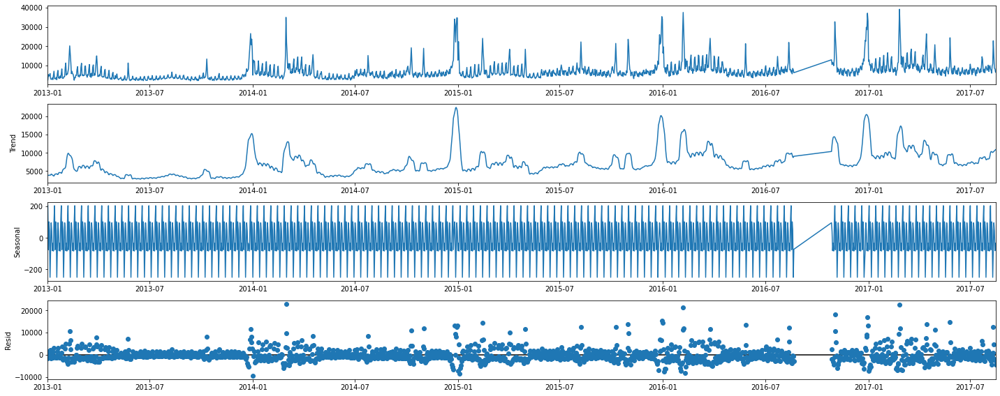

In [9]:
# implement seasonal_decompose
# this function decompose ranf to trend, seaason and reside
decomposition = seasonal_decompose(df_my, model='additive', period=12, extrapolate_trend = 12) 
decomposition.plot()
plt.rcParams['figure.figsize'] = [20, 8]
plt.show()

In [10]:
trend_part = decomposition.trend # trend part
seasonal_part = decomposition.seasonal # seasonal part
residual_part = decomposition.resid # residual part

In [11]:
# lets check the residual part
residual_part.head()

date
2013-01-01   -1529.393684
2013-01-02    1537.918813
2013-01-03     469.908834
2013-01-04     905.692464
2013-01-05    2162.463119
Name: resid, dtype: float64

In [14]:
residual_part = residual_part.dropna()
residual_part.count()

1618

residual par contains 1618 elements, all of which are numeric

In [12]:
seasonal_part.count()

1618

seasonal part contains 1618 elements

In [16]:
trend_part.count()

1618

trend part contains 1618 numeric elements

#### Dicke-Fuller test

In [13]:
test = adfuller(df_my['unit_sales'])
print('adf: ', test[0])
print('p-value: ', test[1])
print('Critical values: ', test[4])
if test[0] > test[4]['5%']:  
    print('Not stationary')
else:
    print('Stationary')

adf:  -4.858992665318182
p-value:  4.188394192907759e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
Stationary


#### Train/Test split

In [15]:
tscv = TimeSeriesSplit()
TimeSeriesSplit(n_splits=3, test_size=7)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=7)

In [16]:
# sizes of splits
train_test_groups = tscv.split(df_my['unit_sales'])
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 273 TEST size: 269
TRAIN size: 542 TEST size: 269
TRAIN size: 811 TEST size: 269
TRAIN size: 1080 TEST size: 269
TRAIN size: 1349 TEST size: 269


#### Rolling mean with window 5.

In [17]:
df = df_my.loc['2013':'2014']
df.head()

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


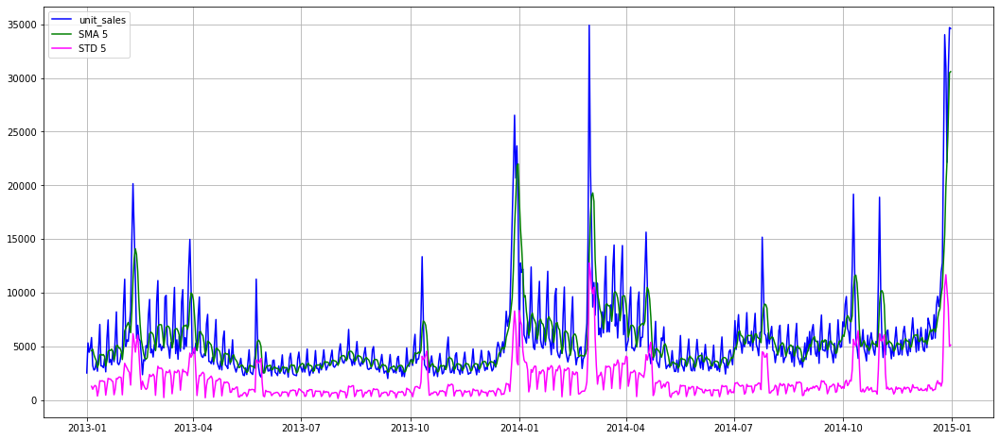

In [18]:
N = 5

## Making rolling mean with windoe N points
df['rolling_mean'] = df.unit_sales.rolling(window=N).mean()

df['rolling_std']  = df.unit_sales.rolling(window=N).std()

## visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.index, df.unit_sales, c='b') ## raw data
ax.plot(df.index, df['rolling_mean'],  c='g') ## window mean
ax.plot(df.index, df['rolling_std'],  c='magenta')
ax.legend(['unit_sales', 'SMA ' + str(N), 'STD ' + str(N)])
ax.grid()

#### Bollindger's lines with window 30

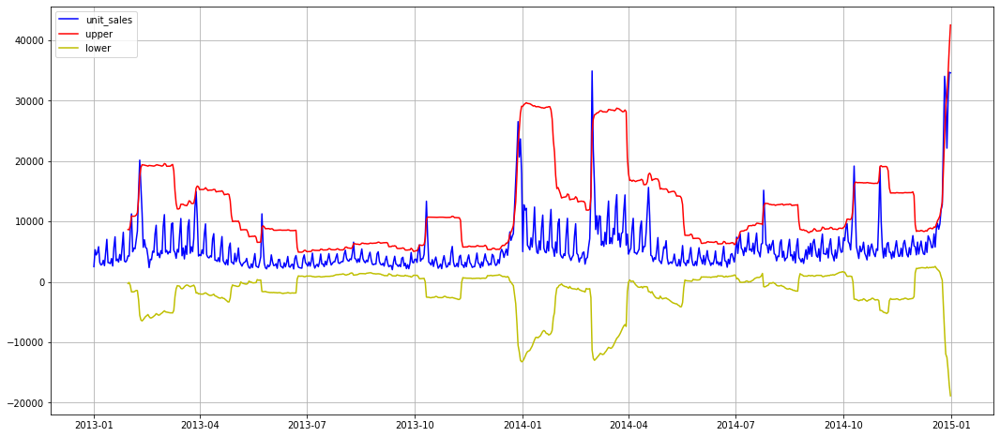

In [19]:
# Bollindger's lines on dataset between 2013 and 2014 

df_lb = df_my.loc['2013':'2014']

N = 30

## rolling mean with window N
df_lb['rolling_mean'] = df_lb.unit_sales.rolling(window=N).mean()

df_lb['rolling_std']  = df_lb.unit_sales.rolling(window=N).std()

# рBollindger's lines calculation
df_lb['upper'] = df_lb['rolling_mean']  + 3 * df_lb['rolling_std'] 
df_lb['lower'] = df_lb['rolling_mean']  - 3 * df_lb['rolling_std'] 

## visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_lb.index, df_lb.unit_sales, c='b') ## исходные данные
ax.plot(df_lb.index, df_lb['upper'],  c='r') ## оконное среднее
ax.plot(df_lb.index, df_lb['lower'],  c='y')
ax.legend(['unit_sales', 'upper ', 'lower '])
ax.grid()

#### Rolling mean wth window 10 and exp mean with window 7

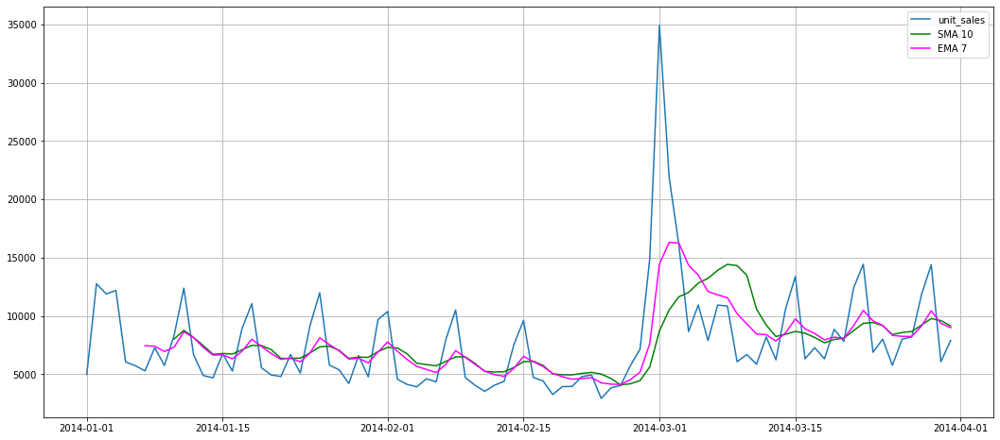

In [20]:
df = df_my.loc['2014-01':'2014-03']

## rolling mean with window 10 
df['rolling_mean_' + str(10)] = df.unit_sales.rolling(window=10).mean()
## exp mean with N points
df['rolling_ema_' + str(7)] = df.unit_sales.ewm(min_periods=7, span=7).mean()

## visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.index, df.unit_sales) ## initial data
ax.plot(df.index, df['rolling_mean_' + str(10)],  c='g') ## window mean
ax.plot(df.index, df['rolling_ema_'  + str(7)],  c='magenta') ## window mean
ax.legend(['unit_sales', 'SMA ' + str(10), 'EMA ' + str(7)])
ax.grid()

#### Rolling function - mean between mas and miin values unit_sales

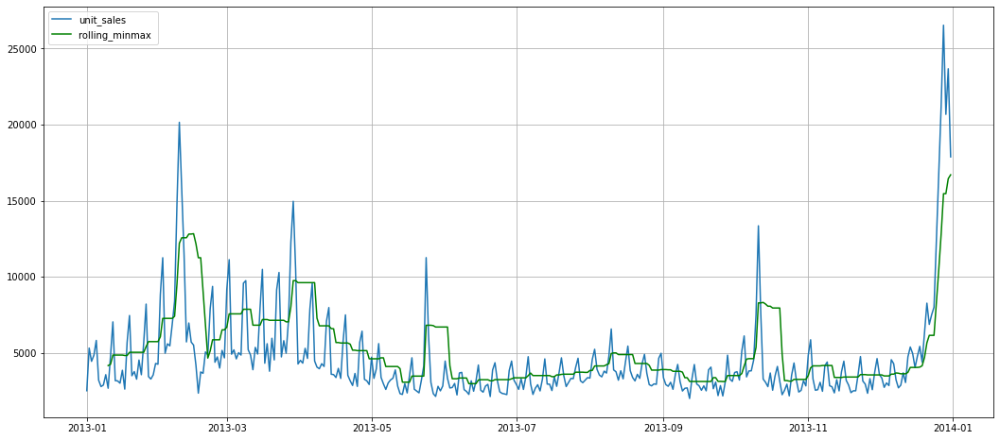

In [21]:
def my_func(value):
    """function to calculat mean between mas and in values"""
    minmax = (max(value)+min(value))/2
    return minmax

df = df_my.loc['2013']

## rolling mean with window 10 
df['rolling_minmax']  = df.unit_sales.rolling(window=10).apply(my_func, raw=False)

## visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.index, df.unit_sales) ## initial data
ax.plot(df.index, df['rolling_minmax'],  c='g') ## rolling mean
ax.legend(['unit_sales', 'rolling_minmax '])
ax.grid()


#### rolling mean and exp rolling mean

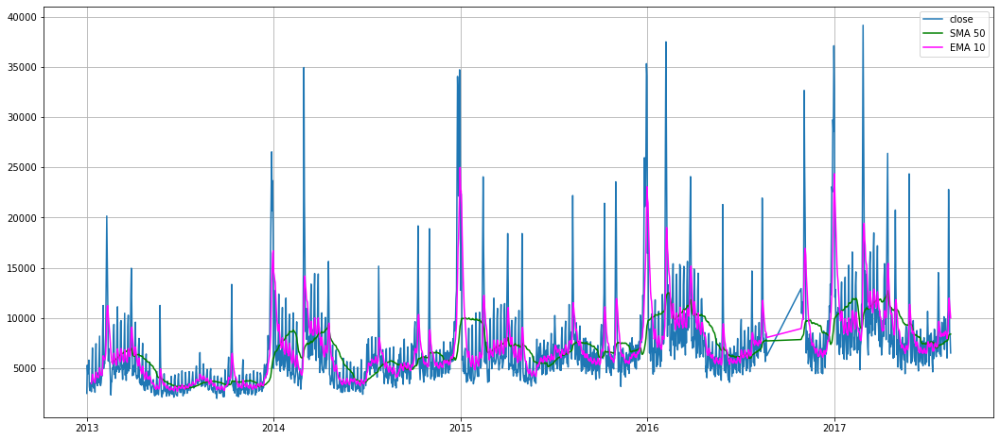

In [22]:
df = df_my

df['rolling_mean_' + str(50)] = df.unit_sales.rolling(window=50).mean()

df['rolling_ema_' + str(10)] = df.unit_sales.ewm(min_periods=10, span=10).mean()

## visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.index, df.unit_sales) ## initial data
ax.plot(df.index, df['rolling_mean_' + str(50)],  c='g') ## rolling mean
ax.plot(df.index, df['rolling_ema_'  + str(10)],  c='magenta') ## rolling mean
ax.legend(['close', 'SMA ' + str(50), 'EMA ' + str(10)])
ax.grid()

#### Cross rolling mean

In [24]:
cross_indexs = (df['rolling_mean_' + str(50)] -
                df['rolling_ema_' + str(10)]).apply(np.sign).diff().dropna()
cross_indexs = cross_indexs[cross_indexs != 0]

In [25]:
# иindecies of rolling mean
cross_indexs.index

DatetimeIndex(['2013-02-20', '2013-02-22', '2013-02-26', '2013-03-02',
               '2013-03-05', '2013-03-09', '2013-03-11', '2013-03-16',
               '2013-03-17', '2013-03-23',
               ...
               '2017-04-19', '2017-04-29', '2017-05-02', '2017-05-26',
               '2017-05-30', '2017-06-03', '2017-06-05', '2017-07-02',
               '2017-07-04', '2017-07-15'],
              dtype='datetime64[ns]', name='date', length=128, freq=None)

#### Lags 7 to 10 (lag7, lag8, lag9, lag10)

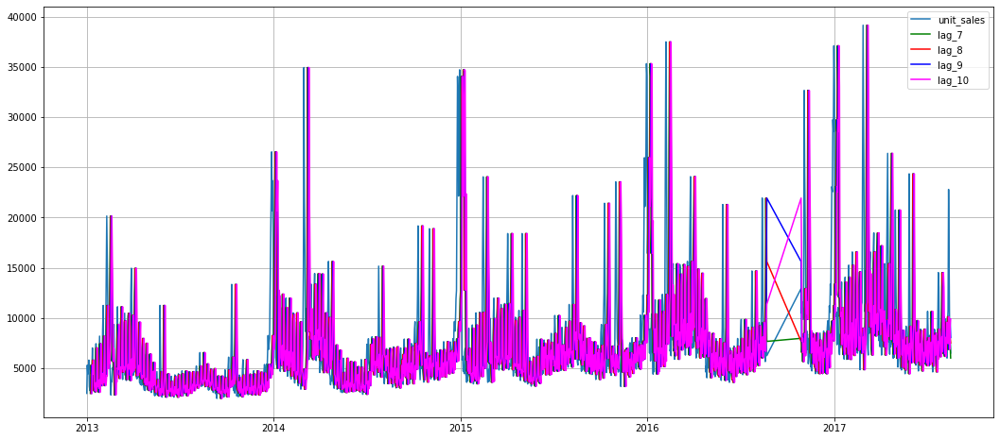

In [26]:
df = df_my

for i in range(7,11):
    df['lag_{}'.format(i)] = df.unit_sales.shift(i)


##visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.index, df.unit_sales) ## иinitial data
ax.plot(df.index, df['lag_' + str(7)],  c='g') 
ax.plot(df.index, df['lag_' + str(8)],  c='r') 
ax.plot(df.index, df['lag_' + str(9)],  c='b') 
ax.plot(df.index, df['lag_' + str(10)],  c='magenta') 
ax.legend(['unit_sales', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

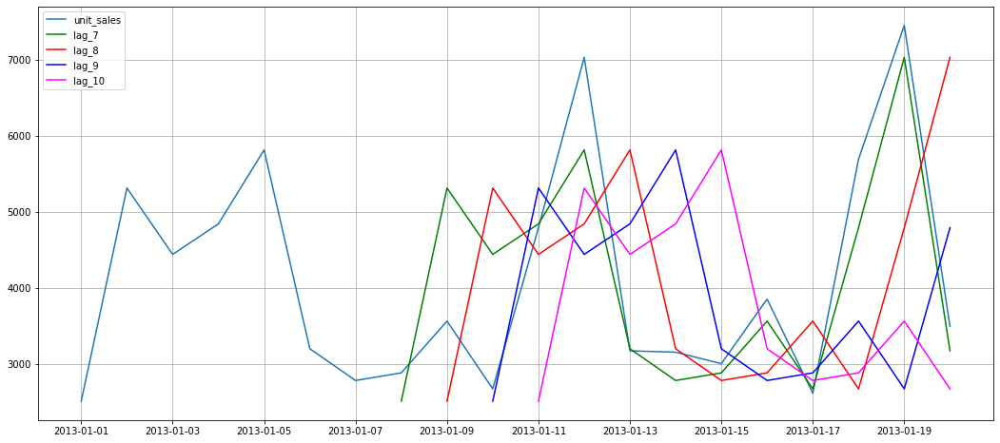

In [27]:
## visualisation
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.index[:20], df.unit_sales[:20]) ## initial data
ax.plot(df.index[:20], df['lag_' + str(7)][:20],  c='g') 
ax.plot(df.index[:20], df['lag_' + str(8)][:20],  c='r') 
ax.plot(df.index[:20], df['lag_' + str(9)][:20],  c='b') 
ax.plot(df.index[:20], df['lag_' + str(10)][:20],  c='magenta') 
ax.legend(['unit_sales', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

### ARMA/ARIMA

In [28]:
top1 = df_train[df_train.item_nbr == 103501 ]
top1['date'] = pd.to_datetime(top1['date'])
top1['year'] = top1['date'].dt.year
unit_sales_by_date = top1.groupby('date').sum()['unit_sales']

#### Addfuller test for stationary time series

In [29]:
X = unit_sales_by_date.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

if result[0] < result[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")

ADF Statistic: -4.154403
p-value: 0.000786
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject Ho - Time Series is Stationary


#### Rolling mean model

(1619,) (1625,)
mean_squared_error 1139.483889232036
mean_absolute_error 26.661828289067326
mean_absolute_percentage_error 0.326732641949257


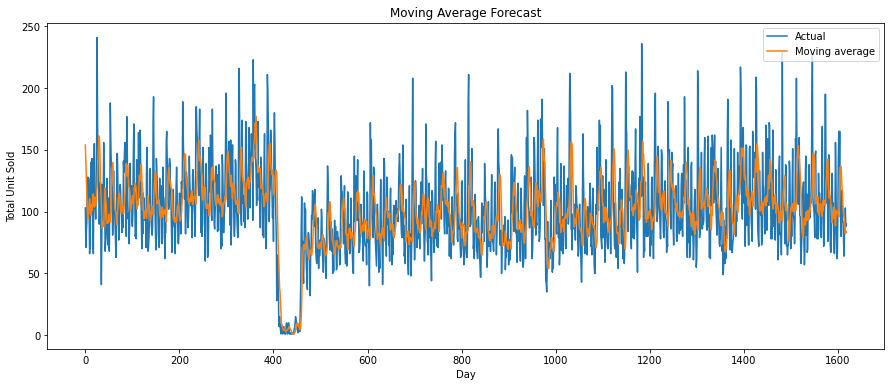

In [30]:
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)
moving_average_days = 6
moving_avg = moving_average_forecast(unit_sales_by_date,moving_average_days )# 

print(moving_avg.shape,unit_sales_by_date.shape)

print("mean_squared_error",mean_squared_error(unit_sales_by_date.values[moving_average_days:], moving_avg))
print("mean_absolute_error",mean_absolute_error(unit_sales_by_date.values[moving_average_days:], moving_avg))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(unit_sales_by_date.values[moving_average_days:], moving_avg))


plt.figure(figsize=(15,6))

plt.plot(unit_sales_by_date.values[moving_average_days:], label="Actual")
plt.plot(moving_avg, label="Moving average")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right")

[[ 0.31483972 -0.06093726 -0.00835441 -0.02690103 -0.05841532  0.65215135]]
[18.74834312]
mean_squared_error (MSE) 913.1612631365097
mean_absolute_error (MAE) 23.42463283045062
mean_absolute_percentage_error (MAPE) 0.21190002900141586


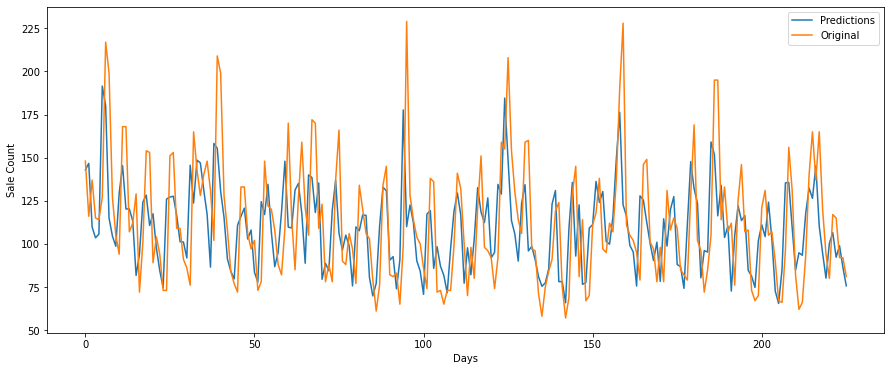

In [31]:
x_train = unit_sales_by_date['2013':'2016'].values
x_test  = unit_sales_by_date['2017'].values

df = pd.DataFrame()

df["Original Values"]  = unit_sales_by_date
df["shift1"] = df["Original Values"].shift()
df["shift2"] = df["shift1"].shift()
df["shift3"] = df["shift2"].shift()
df["shift4"] = df["shift3"].shift()
df["shift5"] = df["shift4"].shift()
df["shift6"] = df["shift5"].shift()


lag_value = 6
df.dropna(inplace=True)


x_train, y_train = df['2013':'2016'].iloc[:,0:lag_value].values, df['2013':'2016'].iloc[:,lag_value:].values
x_test, y_test = df['2017'].iloc[:,0:lag_value].values, df['2017'].iloc[:,lag_value:].values

reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = reg.predict(x_test)

plt.figure(figsize=(15,6))
plt.plot(ar_predictions ,label = "Predictions")
plt.plot(y_test, label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error (MSE)",mean_squared_error(y_test, ar_predictions))
print("mean_absolute_error (MAE)",mean_absolute_error(y_test, ar_predictions))
print("mean_absolute_percentage_error (MAPE)",mean_absolute_percentage_error(y_test, ar_predictions))


plt.legend(loc="upper right")

#### Calculataion  of  p and q

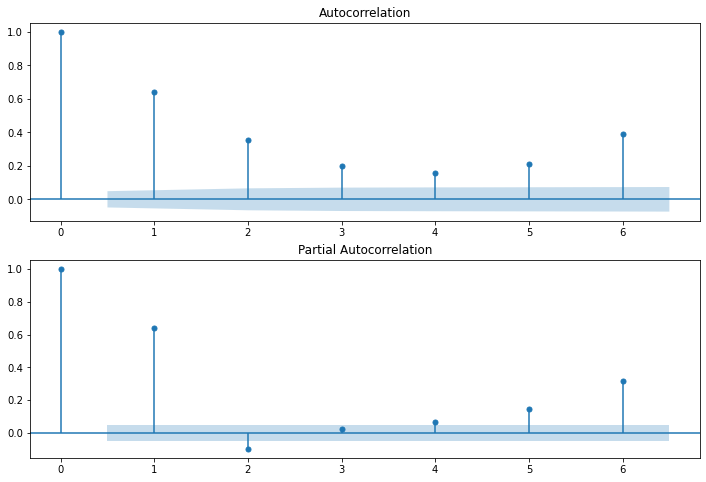

In [32]:

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(unit_sales_by_date.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(unit_sales_by_date, lags=6, ax=ax2)

PACF shows that p = 6, because all lags are different form 0.
ACF shows that q = 6, cause lag 6 increasing. d is 1.
We may make a mode now.
#### ARMA Model

MSE 3255.8123612058403
MAE 47.09765629901801
MAPE 0.4688689747224107


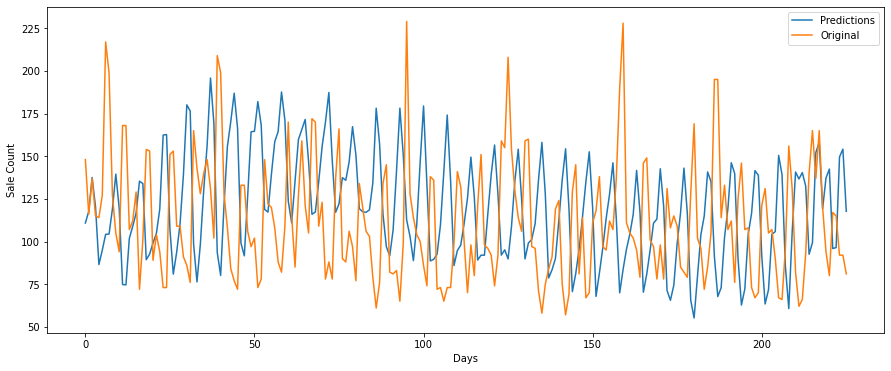

In [33]:
x_train, y_train = df['2013':'2016'].iloc[:,0:lag_value], df['2013':'2016'].iloc[:,lag_value:]
x_test, y_test = df['2017'].iloc[:,0:lag_value], df['2017'].iloc[:,lag_value:]

ARMA_model = ARMA(x_train.values.reshape(-1).tolist(), (6,6)).fit()
arma_predictions = ARMA_model.predict(start=len(x_train), end=len(x_train) + len(x_test)-1, dynamic=False)


plt.figure(figsize=(15,6))
plt.plot(arma_predictions ,label = "Predictions")
plt.plot(y_test.values, label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")
plt.legend(loc="upper right")

print("MSE",mean_squared_error(y_test, arma_predictions))
print("MAE",mean_absolute_error(y_test, arma_predictions))
print("MAPE",mean_absolute_percentage_error(y_test, arma_predictions))


#### ARIMA model

In [34]:
model = ARIMA(x_train['Original Values'].values, (6, 1, 6)).fit()

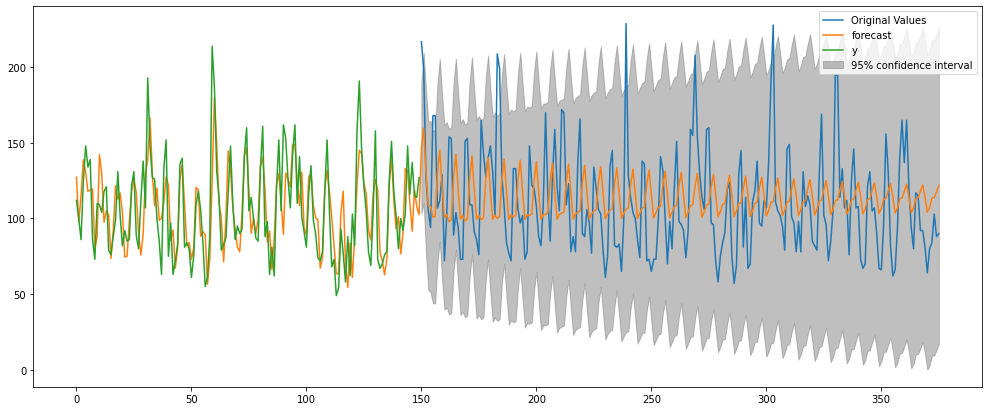

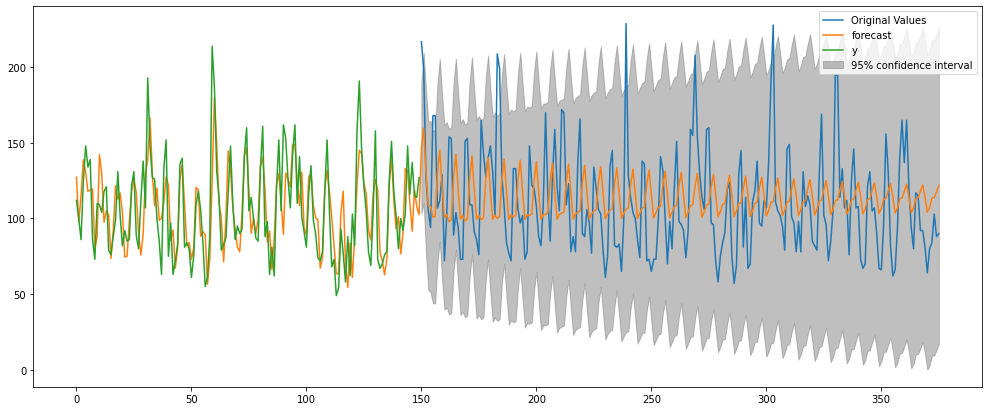

In [35]:
fig, ax = plt.subplots(figsize=(17, 7))
shown_train_size = 150
train_size = len(x_train['Original Values'].values)
test_size = len(x_test['Original Values'].values)
ax = x_test.set_index(pd.Series(range(
    shown_train_size, shown_train_size + test_size)))['Original Values'].plot(ax=ax)
model.plot_predict(start=train_size-shown_train_size, end=train_size +
                   test_size - 1, dynamic=False, plot_insample=True, ax=ax)

In [36]:
arima_predictions = model.predict(train_size, train_size + test_size - 1)
print("MSE_ARIMA", mean_squared_error(y_test, arima_predictions))
print("MAE_ARIMA", mean_absolute_error(y_test, arima_predictions))
print("MAPE_ARIMA", mean_absolute_percentage_error(y_test, arima_predictions))

MSE_ARIMA 13669.319145666588
MAE_ARIMA 112.17320180489106
MAPE_ARIMA 1.0115517118507016


#### Conclusion:
ARIMA metrics more than 2 times higher than ARMA metrics, which means that ARMA model makes better prediction.

## Regresssion models for time series

###  Facebook Prophet

In [37]:
py.init_notebook_mode()

df_pr = df_train.groupby("date")['unit_sales'].sum()
py.iplot([go.Scatter(
    x=df_pr.index,
    y=df_pr
)])

We can see trends increasing and obvious seasonality with drop on 1 January.

Lets prepare data for  Prophet

In [38]:
df_pr = pd.DataFrame(df_pr).reset_index()
df_pr.columns = ['ds', 'y']
df_pr

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121
...,...,...
1679,2017-08-11,826373.722
1680,2017-08-12,792630.535
1681,2017-08-13,865639.677
1682,2017-08-14,760922.406


In [39]:
m = Prophet()
m.fit(df_pr)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,334051.734900,242127.442109,5.146377e+05,334051.734900,3.340517e+05,43512.534378,43512.534378,43512.534378,-68157.290939,-68157.290939,-68157.290939,111669.825316,111669.825316,111669.825316,0.0,0.0,0.0,3.775643e+05
1,2013-01-02,334428.558715,257495.843890,5.325104e+05,334428.558715,3.344286e+05,55547.430208,55547.430208,55547.430208,-44197.657491,-44197.657491,-44197.657491,99745.087699,99745.087699,99745.087699,0.0,0.0,0.0,3.899760e+05
2,2013-01-03,334805.382530,149569.930395,4.130055e+05,334805.382530,3.348054e+05,-44076.068708,-44076.068708,-44076.068708,-131876.949938,-131876.949938,-131876.949938,87800.881230,87800.881230,87800.881230,0.0,0.0,0.0,2.907293e+05
3,2013-01-04,335182.206345,217820.869607,4.977733e+05,335182.206345,3.351822e+05,18979.815624,18979.815624,18979.815624,-57035.600836,-57035.600836,-57035.600836,76015.416460,76015.416460,76015.416460,0.0,0.0,0.0,3.541620e+05
4,2013-01-05,335559.030160,397961.590583,6.653517e+05,335559.030160,3.355590e+05,198559.922942,198559.922942,198559.922942,134003.122248,134003.122248,134003.122248,64556.800694,64556.800694,64556.800694,0.0,0.0,0.0,5.341190e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,990334.073294,908210.859169,1.204119e+06,950814.584777,1.034206e+06,63004.650000,63004.650000,63004.650000,134003.122248,134003.122248,134003.122248,-70998.472247,-70998.472247,-70998.472247,0.0,0.0,0.0,1.053339e+06
2045,2018-08-12,990597.061549,966037.742550,1.263003e+06,950877.916161,1.034626e+06,116920.249888,116920.249888,116920.249888,188404.142851,188404.142851,188404.142851,-71483.892963,-71483.892963,-71483.892963,0.0,0.0,0.0,1.107517e+06
2046,2018-08-13,990860.049803,749454.123885,1.038162e+06,950941.778136,1.034977e+06,-92448.329842,-92448.329842,-92448.329842,-21139.765895,-21139.765895,-21139.765895,-71308.563947,-71308.563947,-71308.563947,0.0,0.0,0.0,8.984117e+05
2047,2018-08-14,991123.038057,704927.209776,1.002908e+06,951006.721250,1.035375e+06,-138631.489615,-138631.489615,-138631.489615,-68157.290939,-68157.290939,-68157.290939,-70474.198676,-70474.198676,-70474.198676,0.0,0.0,0.0,8.524915e+05


In [40]:
py.iplot([
    go.Scatter(x=df_pr['ds'], y=df_pr['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'],
               fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'],
               fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [41]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-df_pr['y'])**2)) )

RMSE: 108278.510635


#### Export with coefficient changepoint_prior_scale

In [42]:
def prophet_cps(N, df_pr):
    """Function makes model Prophit depending on changepoint_prior_scale"""
    # Model with changepoint_prior_scale=N
    m = Prophet(changepoint_prior_scale=N)
    m.fit(df_pr)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    # Visualisation
    print('Модель с changepoint_prior_scale=', N)
    print('RMSE: %f' %
          np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-df_pr['y'])**2)))
    py.iplot([
        go.Scatter(x=df_pr['ds'], y=df_pr['y'], name='y'),
        go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
        go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'],
                   fill='tonexty', mode='none', name='upper'),
        go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'],
                   fill='tonexty', mode='none', name='lower'),
        go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
    ])

In [43]:
n_list = [0.01, 0.1, 0.5, 1.5, 2.5]
for i in n_list:
    prophet_cps(i, df_pr)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Модель с changepoint_prior_scale= 0.01
RMSE: 110841.649746


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Модель с changepoint_prior_scale= 0.1
RMSE: 103895.655055


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Модель с changepoint_prior_scale= 0.5
RMSE: 98439.677778


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Модель с changepoint_prior_scale= 1.5
RMSE: 97614.438844


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Модель с changepoint_prior_scale= 2.5
RMSE: 97468.161183


We need to increase coefficient in order to makes trend more flexible. Trend is underfitted.
RMSE decreased.

#### Adding to the model seasonality (name='monthly', period=30.5, fourier_order=5).

In [44]:
m = Prophet(changepoint_prior_scale=2.5)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df_pr)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [45]:
# calculating RMSE.
print('RMSE: %f' %
      np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-df_pr['y'])**2)))
py.iplot([
    go.Scatter(x=df_pr['ds'], y=df_pr['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'],
               fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'],
               fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 90942.417207


RMSE decreased and the model improved.

Adding to the model holidays. We need two columns: ds and raw for each hoiday.
We can also switch on columns lower_window иand upper_window, which rplong holidays till days around date «[lower_window, upper_window]».

In [46]:
%time df_holidays_events = pd.read_csv('data/holidays_events.csv')
df_holidays_events.sample(5)

Wall time: 14.9 ms


,date,type,locale,locale_name,description,transferred
213,2016-02-09,Holiday,National,Ecuador,Carnaval,False
137,2014-11-02,Holiday,National,Ecuador,Dia de Difuntos,False
208,2015-12-25,Holiday,National,Ecuador,Navidad,False
161,2015-01-10,Work Day,National,Ecuador,Recupero Puente Primer dia del ano,False
18,2012-10-07,Holiday,Local,Quevedo,Cantonizacion de Quevedo,False


In [47]:
holidays = df_holidays_events[df_holidays_events['transferred'] == False][[
    'description', 'date']]
holidays.columns = ['holiday', 'ds']
holidays.sample(5)

,holiday,ds
73,Traslado Independencia de Guayaquil,2013-10-11
300,Carnaval,2017-02-28
32,Cantonizacion de Salinas,2012-12-22
342,Traslado Fundacion de Quito,2017-12-08
12,Cantonizacion de Cayambe,2012-07-23


In [48]:
m = Prophet(changepoint_prior_scale=2.5, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df_pr)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [50]:
# Clalculate RMSE.
print('RMSE: %f' %
      np.sqrt(np.mean((forecast.loc[:1684, 'yhat']-df_pr['y'])**2)))
py.iplot([
    go.Scatter(x=df_pr['ds'], y=df_pr['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'],
               fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'],
               fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 74148.365449


#### Conclusion:
We managed to forcast the changes dirung new year period. Model managed to catch decrease on 4 January 2016, that is why it could predict succesfully 1 January 2017. That happens because on 4 January 2016 there wer now holidays. BUt the model predicts good sales on 24 December ans also well predict period after 15 AUgust 2017.

### Predication with XGBoost
Using dataframe from previous task

In [51]:
df_pr.sample(3)

,ds,y
1388,2016-10-23,1.022954e+06
564,2014-07-20,7.764741e+05
366,2014-01-03,6.806728e+05


In [52]:
df_XGB = df_pr.set_index(pd.DatetimeIndex(df_pr['ds']))
df_XGB.drop(['ds'], axis = 1, inplace = True)

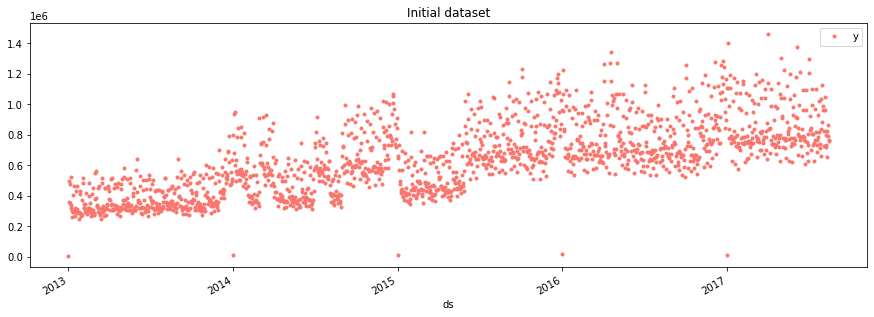

In [54]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = df_XGB.plot(style='.', figsize=(15,5), color=color_pal[0], title='Initial dataset')

#### Train / Test Split

In [56]:
split_date = '01-Jul-2016'
df_XGB_train = df_XGB.loc[df_XGB.index <= split_date].copy()
df_XGB_test = df_XGB.loc[df_XGB.index > split_date].copy()

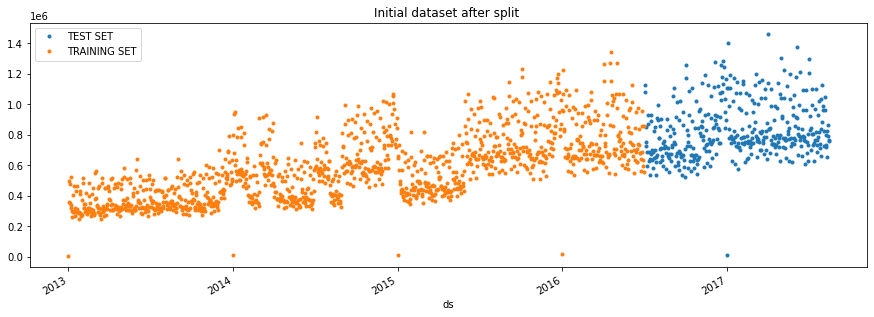

In [57]:
_ = df_XGB_test \
    .rename(columns={'y': 'TEST SET'}) \
    .join(df_XGB_train.rename(columns={'y': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15, 5), title='Initial dataset after split ', style='.')

#### Creating features

In [58]:
def create_features(df, label=None):
    """
    creating features form datetime index
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [59]:
X_train, y_train = create_features(df_XGB_train, label='y')
X_test, y_test = create_features(df_XGB_test, label='y')

### XGBoost Model

In [60]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

#### Features importane

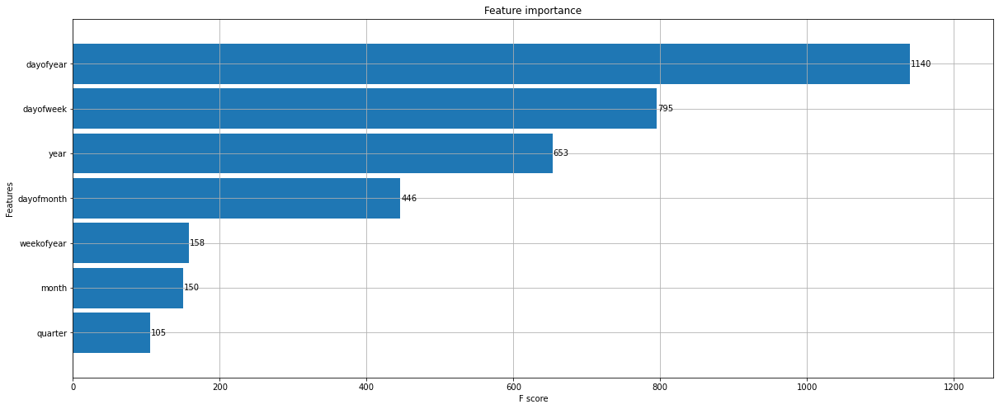

In [60]:
_ = plot_importance(reg, height=0.9)

We see that day of the year the most useful for th trees whie next are day of the week and yaer. Quarter is not so important cause it could have been done by splitting on days and years.

#### Predication onа Test set

In [62]:
df_XGB_test['XGB_Prediction'] = reg.predict(X_test)
df_XGB_all = pd.concat([df_XGB_test, df_XGB_train], sort=False)

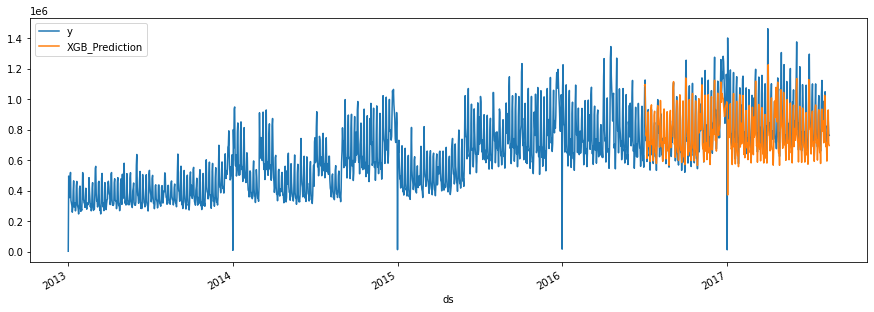

In [63]:
_ = df_XGB_all[['y', 'XGB_Prediction']].plot(figsize=(15, 5))

#### Lets assess the first month

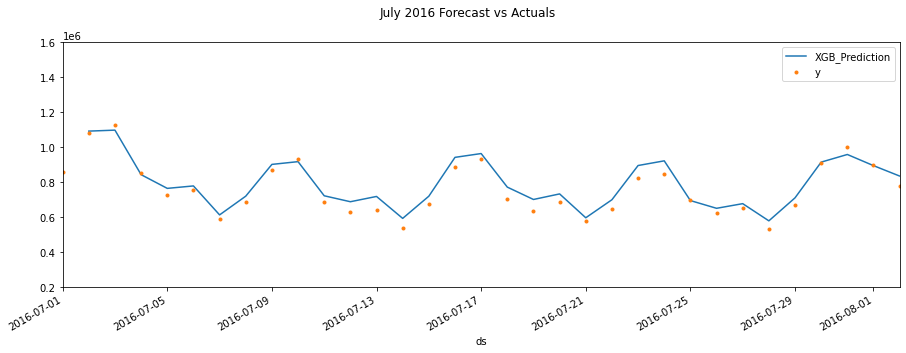

In [64]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_XGB_all[['XGB_Prediction', 'y']].plot(ax=ax,
                                             style=['-', '.'])
ax.set_xbound(lower='07-01-2016', upper='08-02-2016')
ax.set_ylim(200000, 1600000)
plot = plt.suptitle('July 2016 Forecast vs Actuals')

#### Lets check the first week

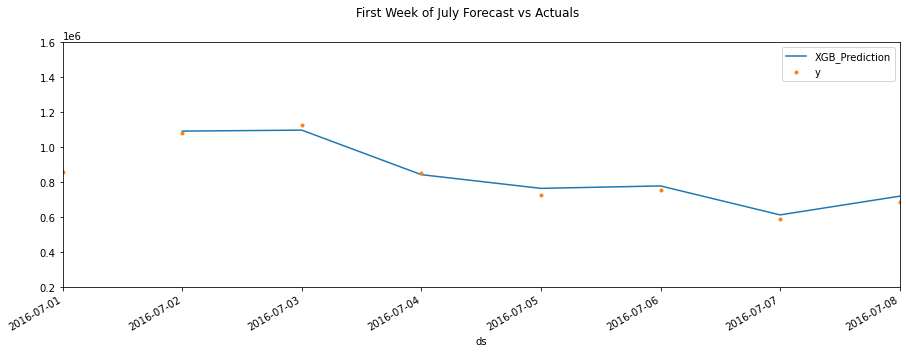

In [65]:
# Predict with actua data
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_XGB_all[['XGB_Prediction', 'y']].plot(ax=ax,
                                             style=['-', '.'])
ax.set_xbound(lower='07-01-2016', upper='07-08-2016')
ax.set_ylim(200000, 1600000)
plot = plt.suptitle('First Week of July Forecast vs Actuals')

#### Errors on  Test

In [66]:
def mean_errors(y_true, y_pred):
    """Calculate MSE, MAE и MAPE пon y_true и y_pred"""
    mse = mean_squared_error(y_true=y_true, y_pred=y_pred)
    mae = mean_absolute_error(y_true=y_true, y_pred=y_pred)

    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    return mse, mae, mape

In [67]:
mse, mae, mape = mean_errors(
    y_true=df_XGB_test['y'], y_pred=df_XGB_test['XGB_Prediction'])
print('MSE = {}, MAE = {}, MAPE = {}'.format(mse, mae, mape))

MSE = 14355211919.162754, MAE = 80675.37100427866, MAPE = 28.2615757842281


#### CHeking the best and the worst predications

In [68]:
df_XGB_test['error'] = df_XGB_test['y'] - df_XGB_test['XGB_Prediction']
df_XGB_test['abs_error'] = df_XGB_test['error'].apply(np.abs)
error_by_day = df_XGB_test.groupby(['year', 'month', 'dayofmonth']) \
    .mean()[['y', 'XGB_Prediction', 'error', 'abs_error']]

In [69]:
# By dates
error_by_day.sort_values('error', ascending=True).head(10)

y  XGB_Prediction        error    abs_error
year month dayofmonth                                                      
2017 1     1            12082.501    9.663358e+05 -954253.3115  954253.3115
     4     19          735733.214    1.078104e+06 -342371.0360  342371.0360
           18          717196.316    9.916849e+05 -274488.5590  274488.5590
           20          675803.022    9.490620e+05 -273258.9780  273258.9780
2016 8     13          714905.919    9.090640e+05 -194158.0810  194158.0810
           14          761826.128    9.365649e+05 -174738.7470  174738.7470
2017 2     26          775708.988    9.478058e+05 -172096.7620  172096.7620
2016 11    5           887751.299    1.025215e+06 -137463.7010  137463.7010
     8     30          624711.335    7.594199e+05 -134708.6025  134708.6025
           6           858903.212    9.919917e+05 -133088.4755  133088.4755

- Худший день №1 - 1 января 2017 года - выходной.
- Худший день №5 - 13 августа 2016 года - выходной
- Худший день №6 - 14 августа 2016 года - выходной.

In [70]:
# THe worst days
error_by_day.sort_values('abs_error', ascending=False).head(10)

y  XGB_Prediction         error     abs_error
year month dayofmonth                                                         
2017 1     2           1402305.371    3.718057e+05  1.030500e+06  1.030500e+06
           1             12082.501    9.663358e+05 -9.542533e+05  9.542533e+05
     5     1           1306699.367    9.185855e+05  3.881139e+05  3.881139e+05
     4     19           735733.214    1.078104e+06 -3.423710e+05  3.423710e+05
           1           1463083.963    1.142376e+06  3.207076e+05  3.207076e+05
     2     28           949366.829    6.364139e+05  3.129530e+05  3.129530e+05
2016 12    24          1246837.843    9.592492e+05  2.875886e+05  2.875886e+05
           23          1282145.517    1.006725e+06  2.754202e+05  2.754202e+05
2017 4     18           717196.316    9.916849e+05 -2.744886e+05  2.744886e+05
           20           675803.022    9.490620e+05 -2.732590e+05  2.732590e+05

- The worst day №3 - 1 мая 2017 года - holiday.
- The worst day №7 - 24 декабря 2016 года - Christmas.

We need to add holidays to improve the model

In [71]:
# The best prediction days
error_by_day.sort_values('abs_error', ascending=True).head(10)

y  XGB_Prediction      error  abs_error
year month dayofmonth                                                  
2016 8     23          660819.978     660621.6250   198.3530   198.3530
     9     23          663685.985     664073.8125  -387.8275   387.8275
     11    10          588241.759     589458.8750 -1217.1160  1217.1160
     8     1           895580.405     894203.3750  1377.0300  1377.0300
           24          674613.048     672364.3750  2248.6730  2248.6730
2017 4     15          898610.218     896070.4375  2539.7805  2539.7805
           16          985493.796     988126.4375 -2632.6415  2632.6415
2016 10    21          669453.542     672171.1875 -2717.6455  2717.6455
     7     25          697383.602     694365.0000  3018.6020  3018.6020
           30          910213.872     914283.6250 -4069.7530  4069.7530

Many well predicted days in August(not much holidays)

#### Building best/worst predicition days

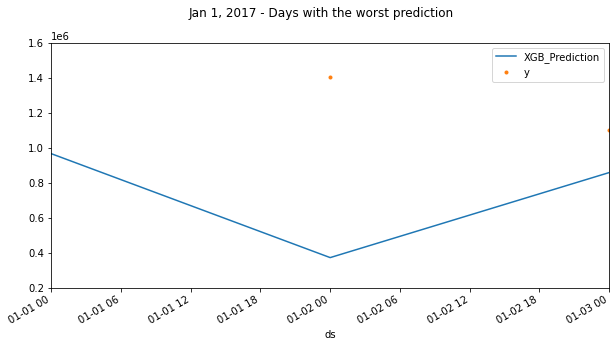

In [72]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = df_XGB_all[['XGB_Prediction', 'y']].plot(ax=ax,
                                             style=['-', '.'])
ax.set_ylim(200000, 1600000)
ax.set_xbound(lower='01-01-2017', upper='01-03-2017')
plot = plt.suptitle('Jan 1, 2017 - Days with the worst prediction')

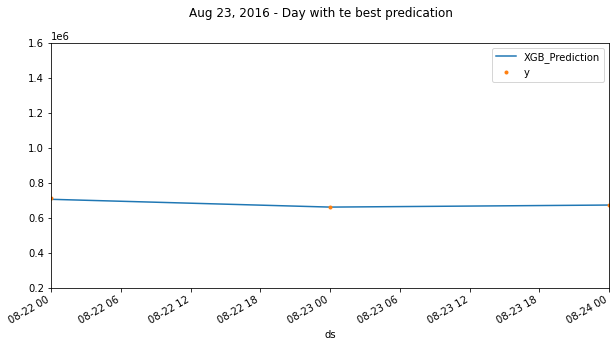

In [73]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = df_XGB_all[['XGB_Prediction', 'y']].plot(ax=ax,
                                             style=['-', '.'])
ax.set_ylim(200000, 1600000)
ax.set_xbound(lower='08-22-2016', upper='08-24-2016')
plot = plt.suptitle('Aug 23, 2016 - Day with te best predication')

### CatBoost Model

In [74]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

In [75]:
df_XGB_test['CTB_Prediction'] = cbr.predict(X_test)
df_XGB_all = pd.concat([df_XGB_test, df_XGB_train], sort=False)

In [76]:
mse, mae, mape = mean_errors(y_true=df_XGB_test['y'],y_pred=df_XGB_test['CTB_Prediction'])
print('MSE = {}, MAE = {}, MAPE = {}'.format(mse, mae, mape))

MSE = 22607912959.298733, MAE = 110730.50946251492, MAPE = 28.615367584741186


CatBoost is a bit worse than XGB and need better tuning.

#### Adding holidays

In [77]:
#  making list of holidays
hd_ls = holidays.ds.astype('datetime64[ns]').drop_duplicates()


def find_holiday(holiday):
    """Fuction to detirmine it the day was holiday or not"""
    for l in range(len(hd_ls)):
        try:
            if holiday == hd_ls[l]:
                res = 1  # holiday
                break
            else:
                res = 0  # not a holiday
        except:
            continue
    return res

In [78]:
#  adding holidays in training set
X_train['date'] = X_train.index
X_train['holiday'] = X_train['date'].apply(lambda x: find_holiday(x))
X_train.drop(['date'], axis=1, inplace=True)

In [79]:
X_train

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,holiday
ds,,,,,,,,,
2013-01-01,0,1,1,1,2013,1,1,1,1
2013-01-02,0,2,1,1,2013,2,2,1,0
2013-01-03,0,3,1,1,2013,3,3,1,0
2013-01-04,0,4,1,1,2013,4,4,1,0
2013-01-05,0,5,1,1,2013,5,5,1,1
...,...,...,...,...,...,...,...,...,...
2016-06-27,0,0,2,6,2016,179,27,26,0
2016-06-28,0,1,2,6,2016,180,28,26,0
2016-06-29,0,2,2,6,2016,181,29,26,0


In [80]:
#  adding holidays into test set
X_test['date'] = X_test.index
X_test['holiday'] = X_test['date'].apply(lambda x: find_holiday(x))
X_test.drop(['date'], axis=1, inplace=True)

### XGBoost Model with holidays

In [81]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [82]:
df_XGB_test['XGB_Prediction'] = reg.predict(X_test)
df_XGB_all = pd.concat([df_XGB_test, df_XGB_train], sort=False)

In [83]:
mse, mae, mape = mean_errors(
    y_true=df_XGB_test['y'], y_pred=df_XGB_test['XGB_Prediction'])
print('MSE = {}, MAE = {}, MAPE = {}'.format(mse, mae, mape))

MSE = 13576278666.38232, MAE = 79470.31665342287, MAPE = 26.749601621640977


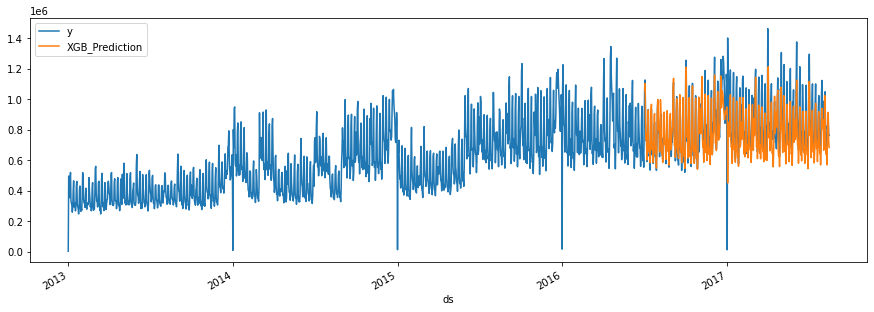

In [84]:
_ = df_XGB_all[['y','XGB_Prediction']].plot(figsize=(15, 5))

Error is smaller than without holidays

### CatBoost Model wiht holidays

In [85]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

In [86]:
df_XGB_test['CTB_Prediction'] = cbr.predict(X_test)
df_XGB_all = pd.concat([df_XGB_test, df_XGB_train], sort=False)

In [87]:
mse, mae, mape = mean_errors(
    y_true=df_XGB_test['y'], y_pred=df_XGB_test['CTB_Prediction'])
print('MSE = {}, MAE = {}, MAPE = {}'.format(mse, mae, mape))

MSE = 22357172530.8625, MAE = 107749.60210662242, MAPE = 31.39774105496544


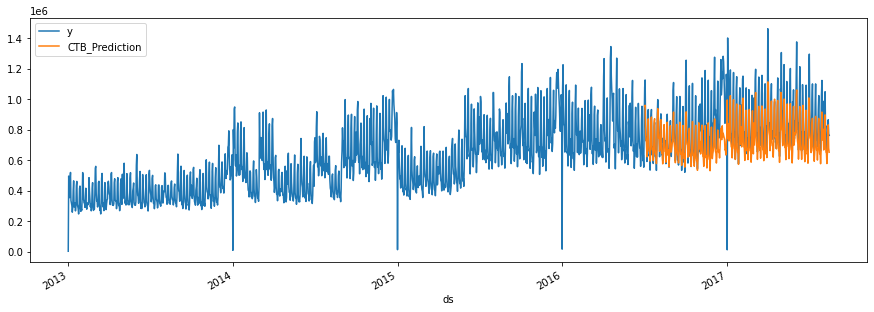

In [88]:
_ = df_XGB_all[['y','CTB_Prediction']].plot(figsize=(15, 5))

Error is worse, we need additional tuning

### Adding lags

In [89]:
# dataset for model with lags
df_lag = df_pr.set_index(pd.DatetimeIndex(df_pr['ds']))
df_lag.drop(['ds'], axis=1, inplace=True)

In [90]:
df_lag

,y
ds,
2013-01-01,2511.619
2013-01-02,496092.418
2013-01-03,361429.231
2013-01-04,354459.677
2013-01-05,477350.121
...,...
2017-08-11,826373.722
2017-08-12,792630.535
2017-08-13,865639.677


In [91]:
#  adding lags
df_lag["shift1"] = df_lag['y'].shift()
df_lag["shift2"] = df_lag["shift1"].shift()
df_lag["shift3"] = df_lag["shift2"].shift()
df_lag["shift4"] = df_lag["shift3"].shift()
df_lag["shift5"] = df_lag["shift4"].shift()
df_lag["shift6"] = df_lag["shift5"].shift()
df_lag

,y,shift1,shift2,shift3,shift4,shift5,shift6
ds,,,,,,,
2013-01-01,2511.619,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,496092.418,2511.619,NaN,NaN,NaN,NaN,NaN
2013-01-03,361429.231,496092.418,2511.619,NaN,NaN,NaN,NaN
2013-01-04,354459.677,361429.231,496092.418,2511.619,NaN,NaN,NaN
2013-01-05,477350.121,354459.677,361429.231,496092.418,2511.619,NaN,NaN
...,...,...,...,...,...,...,...
2017-08-11,826373.722,651386.912,734139.674,717766.349,797464.964,1049559.164,965693.650
2017-08-12,792630.535,826373.722,651386.912,734139.674,717766.349,797464.964,1049559.164
2017-08-13,865639.677,792630.535,826373.722,651386.912,734139.674,717766.349,797464.964


In [92]:
#  split dataset to train and test
split_date = '01-Jul-2016'
df_lag_train = df_lag.loc[df_lag.index <= split_date].copy()
df_lag_test = df_lag.loc[df_lag.index > split_date].copy()

In [93]:
def create_features_lag(df, label=None):
    """
   creating features from datetime index 
    wiht holidays 
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    df['holiday'] = df['date'].apply(lambda x: find_holiday(x))
       
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear','holiday',
            'shift1', 'shift2', 'shift3', 'shift4', 'shift5', 'shift6'
           ]]
    if label:
        y = df[label]
        return X, y
    return X

In [94]:
#  slpit dataset
X_train_lag, y_train_lag = create_features_lag(df_lag_train, label='y')
X_test_lag, y_test_lag = create_features_lag(df_lag_test, label='y')

In [95]:
X_test_lag

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,holiday,shift1,shift2,shift3,shift4,shift5,shift6
ds,,,,,,,,,,,,,,,
2016-07-02,0,5,3,7,2016,184,2,26,0,857027.554,554144.865,632489.477,596948.935,684735.609,954344.667
2016-07-03,0,6,3,7,2016,185,3,26,1,1078485.141,857027.554,554144.865,632489.477,596948.935,684735.609
2016-07-04,0,0,3,7,2016,186,4,27,0,1126713.708,1078485.141,857027.554,554144.865,632489.477,596948.935
2016-07-05,0,1,3,7,2016,187,5,27,0,850891.598,1126713.708,1078485.141,857027.554,554144.865,632489.477
2016-07-06,0,2,3,7,2016,188,6,27,0,728011.558,850891.598,1126713.708,1078485.141,857027.554,554144.865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,0,4,3,8,2017,223,11,32,0,651386.912,734139.674,717766.349,797464.964,1049559.164,965693.650
2017-08-12,0,5,3,8,2017,224,12,32,0,826373.722,651386.912,734139.674,717766.349,797464.964,1049559.164
2017-08-13,0,6,3,8,2017,225,13,32,0,792630.535,826373.722,651386.912,734139.674,717766.349,797464.964


### XGBoost model with lags

In [96]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train_lag, y_train_lag,
        eval_set=[(X_train_lag, y_train_lag), (X_test_lag, y_test_lag)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [97]:
df_lag_test['XGB_Prediction'] = reg.predict(X_test_lag)
df_lag_all = pd.concat([df_lag_test, df_lag_train], sort=False)

In [98]:
mse, mae, mape = mean_errors(
    y_true=df_lag_test['y'], y_pred=df_lag_test['XGB_Prediction'])
print('MSE = {}, MAE = {}, MAPE = {}'.format(mse, mae, mape))

MSE = 11065231021.591696, MAE = 68473.01186797046, MAPE = 24.040049374474627


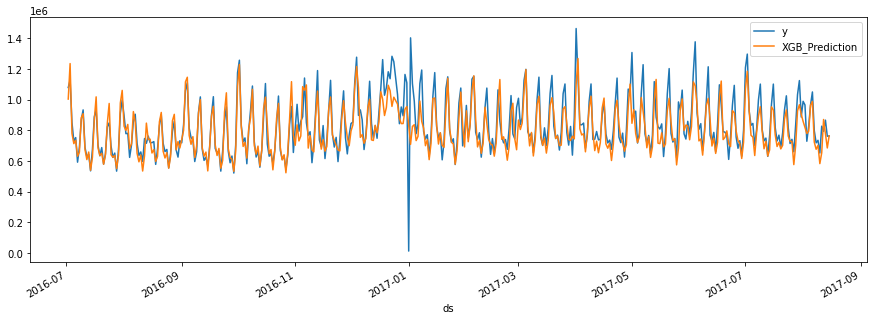

In [99]:
_ = df_lag_test[['y','XGB_Prediction']].plot(figsize=(15, 5))

MOdel with 6 lags and holidays shows better results - MAPE = 24.040049374474627

### CatBoost model with lags

In [100]:
# adding tuning into CatBoost
cbr = CatBoostRegressor(
    random_seed=42,
    n_estimators=1000,
    learning_rate=0.25,
    depth=1,
    logging_level='Silent')
cbr.fit(X_train_lag, y_train_lag,
        eval_set=[(X_train_lag, y_train_lag), (X_test_lag, y_test_lag)],
        early_stopping_rounds=50,
        verbose=False)

In [101]:
df_lag_test['CTB_Prediction'] = cbr.predict(X_test_lag)
df_lag_all = pd.concat([df_lag_test, df_lag_train], sort=False)

In [102]:
mse, mae, mape = mean_errors(y_true=df_lag_test['y'],y_pred=df_lag_test['CTB_Prediction'])
print('MSE = {}, MAE = {}, MAPE = {}'.format(mse, mae, mape))

MSE = 9671179306.038399, MAE = 70194.33633657733, MAPE = 16.98138636213179


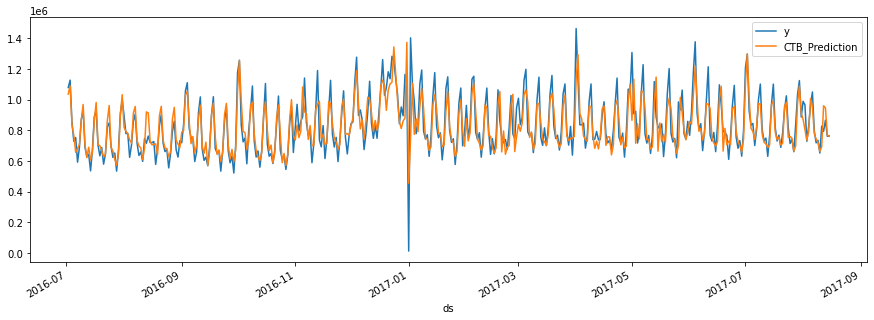

In [103]:
_ = df_lag_test[['y','CTB_Prediction']].plot(figsize=(15, 5))

Prediation is uch better and error is smaller(MAPE = 16.98138636213179).

### Conclusion:

Metrics are better with new features and model tuning.
XGB with new features has MAPE = 28.2615757842281. 
When added holidays feature it becomes MAPE = 26.749601621640977.
Lags imprved results to MAPE = 24.040049374474627.

At teh same time tuning of CatBoost made from MAPE = 31.39774105496544 to MAPE = 16.98138636213179.

The most imprtant role in prediction pays new features, lags and use consideration of holidays.